# Setup

### Install relevant packages

In [1]:
#pip install pandas-profiling

### Import packages

In [2]:
# general packages
import pandas as pd
from tqdm.auto import tqdm
import os

In [3]:
# packages for importing variables from YAML file
import yaml

In [4]:
# packages for analysing features
import pandas_profiling as pp

### Configure max rows and max columns¶

In [5]:
pd.set_option("display.max_columns", 200)
pd.set_option("display.max_rows", 100)

### Load in the '.py' file containg the functions used in this notebook

In [6]:
%load_ext autoreload
%autoreload 1
%aimport data_processing_functions

import data_processing_functions as dp

# --------------------------------------------------------------------------------------------------------------

# Read in variables from YAML configuration file

In [7]:
# read in YAML configuration file
with open("../../config_files/config.yaml", "r") as variables:
    config_variables = yaml.load(variables, Loader=yaml.FullLoader)

In [8]:
data_directory = config_variables["data_directory"]

In [9]:
profile_report_directory = config_variables["profile_report_directory"]

In [10]:
# price shift periods to add to the data
periods_in_days = config_variables["shift_periods_in_days_list"]

# --------------------------------------------------------------------------------------------------------------

# Read in the data

In [11]:
all_scraped_data = pd.read_csv(os.path.join(data_directory, "all_scraped_data.csv"))

In [12]:
dp.get_date_range_of_data(all_scraped_data)

Scraped 4541 days of data - from '2009-01-01' to '2021-06-08'


#### Check for NaNs

In [13]:
nan_col_dates = dp.find_col_nan_ranges(all_scraped_data, output=True)


---------------------------------------------------------------------
918 columns had a 'NaN' value in them:
['trading_volume',
 'trades_per_minute',
 'volatility',
 'bid_and_ask_spread',
 'bid_and_ask_sum_asks',
 'bid_and_ask_sum_bids',
 'time_between_blocks',
 'block_size_votes',
 'rank_bit_x',
 'rank_bitfinex',
 'rank_bitstamp',
 'rank_btce',
 'rank_coinbase',
 'rank_itbit',
 'rank_kraken',
 'rank_mtgox',
 'rank_okcoin',
 'rank_others',
 'marketcap3sma',
 'marketcap7sma',
 'marketcap14sma',
 'marketcap30sma',
 'marketcap90sma',
 'marketcap3ema',
 'marketcap7ema',
 'marketcap14ema',
 'marketcap30ema',
 'marketcap90ema',
 'marketcap3wma',
 'marketcap7wma',
 'marketcap14wma',
 'marketcap30wma',
 'marketcap90wma',
 'marketcap3trx',
 'marketcap7trx',
 'marketcap14trx',
 'marketcap30trx',
 'marketcap90trx',
 'marketcap3mom',
 'marketcap7mom',
 'marketcap14mom',
 'marketcap30mom',
 'marketcap90mom',
 'marketcap3std',
 'marketcap7std',
 'marketcap14std',
 'marketcap30std',
 'marketcap90std

 'price3roc': [('2009-01-01', '2010-07-20')],
 'price3rsi': [('2009-01-01', '2010-07-20')],
 'price3sma': [('2009-01-01', '2010-07-19')],
 'price3std': [('2009-01-01', '2010-07-19')],
 'price3trx': [('2009-01-01', '2010-07-24')],
 'price3var': [('2009-01-01', '2010-10-27')],
 'price3wma': [('2009-01-01', '2010-07-19')],
 'price7ema': [('2009-01-01', '2010-07-23')],
 'price7mom': [('2009-01-01', '2010-07-24')],
 'price7roc': [('2009-01-01', '2010-07-24')],
 'price7rsi': [('2009-01-01', '2010-07-24')],
 'price7sma': [('2009-01-01', '2010-07-23')],
 'price7std': [('2009-01-01', '2010-07-23')],
 'price7trx': [('2009-01-01', '2010-08-05')],
 'price7var': [('2009-01-01', '2010-10-27')],
 'price7wma': [('2009-01-01', '2010-07-23')],
 'price90ema': [('2009-01-01', '2010-10-14')],
 'price90mom': [('2009-01-01', '2010-10-15')],
 'price90roc': [('2009-01-01', '2010-10-15')],
 'price90rsi': [('2009-01-01', '2010-10-15')],
 'price90sma': [('2009-01-01', '2010-10-14')],
 'price90std': [('2009-01-01'

#### Find the latest date with an NaN in it

In [14]:
dp.find_the_latest_date_each_column_starts(nan_col_dates, n_cols_to_print=100)

sweden_gov_debt_all --> 2018-01-01
denmark_gov_debt_all --> 2018-01-01
rank_bit_x --> 2015-08-17
rank_coinbase --> 2015-01-26
bid_and_ask_sum_bids --> 2015-01-26
bid_and_ask_sum_asks --> 2015-01-26
tweets90trx --> 2015-01-02
rank_okcoin --> 2014-07-29
tweets90rsi --> 2014-07-08
tweets90roc --> 2014-07-08
tweets90mom --> 2014-07-08
tweets90wma --> 2014-07-07
tweets90var --> 2014-07-07
tweets90std --> 2014-07-07
tweets90sma --> 2014-07-07
tweets90ema --> 2014-07-07
tweets30trx --> 2014-07-06
tweets14trx --> 2014-05-19
tweets30rsi --> 2014-05-09
tweets30roc --> 2014-05-09
tweets30mom --> 2014-05-09
tweets30wma --> 2014-05-08
tweets30var --> 2014-05-08
tweets30std --> 2014-05-08
tweets30sma --> 2014-05-08
tweets30ema --> 2014-05-08
aluminium_futures_volume --> 2014-05-06
aluminium_futures_open --> 2014-05-06
aluminium_futures_low --> 2014-05-06
aluminium_futures_high --> 2014-05-06
aluminium_futures_close --> 2014-05-06
tweets7trx --> 2014-04-28
tweets14rsi --> 2014-04-23
tweets14roc --> 2

The above is used to select the interval size that we will use to train our data on.

We will try to select values that are early enough so that we have as much data as possible, but late enough so that we do not have to drop any columns.

We will have to drop these columns if they do not have data for every day within our specified range.

# --------------------------------------------------------------------------------------------------------------

# Add cyclical time features to the data

### Day of the week features

In [15]:
cos_dotw_feature, sin_dotw_feature = dp.create_cyclical_day_features(all_scraped_data)

In [16]:
pd.concat([cos_dotw_feature, sin_dotw_feature], axis=1)

,0,0
0,1.0,0.000000e+00
1,0.5,8.660254e-01
2,-0.5,8.660254e-01
3,-1.0,1.224647e-16
4,-0.5,-8.660254e-01
...,...,...
4537,0.5,8.660254e-01
4538,-0.5,8.660254e-01
4539,-1.0,1.224647e-16
4540,-0.5,-8.660254e-01


In [17]:
all_scraped_data["cos_dotw"] = cos_dotw_feature
all_scraped_data["sin_dotw"] = sin_dotw_feature

### Day of the month features

In [18]:
cos_dotm_feature, sin_dotm_feature = dp.create_cyclical_month_features(all_scraped_data)

In [19]:
pd.concat([cos_dotm_feature, sin_dotm_feature], axis=1)

,0,0
0,0.841254,0.540641
1,0.841254,0.540641
2,0.841254,0.540641
3,0.841254,0.540641
4,0.841254,0.540641
...,...,...
4537,-0.959493,-0.281733
4538,-0.959493,-0.281733
4539,-0.959493,-0.281733
4540,-0.959493,-0.281733


In [20]:
all_scraped_data["cos_dotm"] = cos_dotm_feature
all_scraped_data["sin_dotm"] = sin_dotm_feature

# --------------------------------------------------------------------------------------------------------------

# Correlation plot

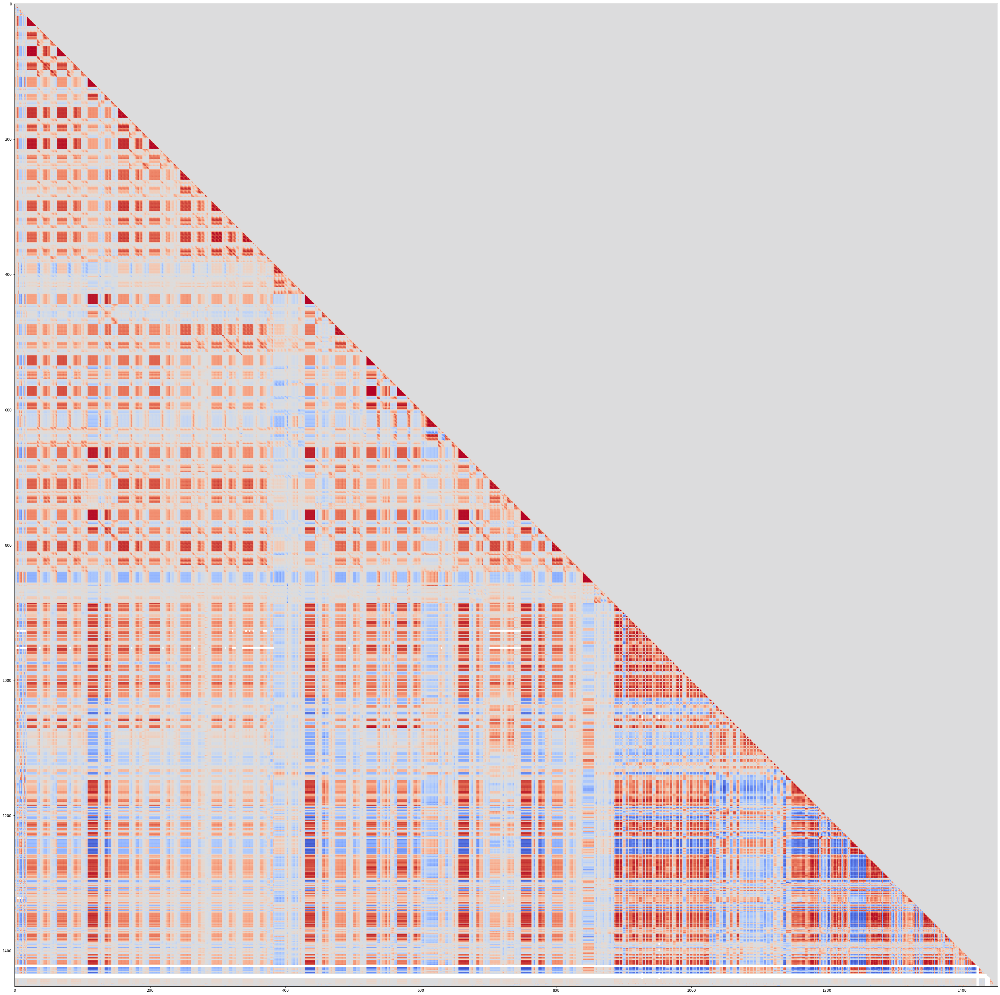

In [21]:
dp.create_correlation_plot(all_scraped_data.drop(columns=["date"]))

# --------------------------------------------------------------------------------------------------------------

# Add the shifted price columns

### Add a shifted price column and a shifted binary increase/decrease column to the data for each period

In [22]:
shifted_price_df = dp.add_all_shifted_price_cols(all_scraped_data, periods_in_days)

In [23]:
shifted_price_df.head()

,date,trading_volume,trades_per_minute,volatility,bid_and_ask_spread,bid_and_ask_sum_asks,bid_and_ask_sum_bids,time_between_blocks,block_size_votes,rank_bit_x,rank_bitfinex,rank_bitstamp,rank_btce,rank_coinbase,rank_itbit,rank_kraken,rank_mtgox,rank_okcoin,rank_others,marketcap3sma,marketcap7sma,marketcap14sma,marketcap30sma,marketcap90sma,marketcap3ema,marketcap7ema,marketcap14ema,marketcap30ema,marketcap90ema,marketcap3wma,marketcap7wma,marketcap14wma,marketcap30wma,marketcap90wma,marketcap3trx,marketcap7trx,marketcap14trx,marketcap30trx,marketcap90trx,marketcap3mom,marketcap7mom,marketcap14mom,marketcap30mom,marketcap90mom,marketcap3std,marketcap7std,marketcap14std,marketcap30std,marketcap90std,marketcap3var,marketcap7var,marketcap14var,marketcap30var,marketcap90var,marketcap3rsi,marketcap7rsi,marketcap14rsi,marketcap30rsi,marketcap90rsi,marketcap3roc,marketcap7roc,marketcap14roc,marketcap30roc,marketcap90roc,price3sma,price7sma,price14sma,price30sma,price90sma,price3ema,price7ema,price14ema,price30ema,price90ema,price3wma,price7wma,price14wma,price30wma,price90wma,price3trx,price7trx,price14trx,price30trx,price90trx,price3mom,price7mom,price14mom,price30mom,price90mom,price3std,price7std,price14std,price30std,price90std,price3var,price7var,price14var,price30var,price90var,price3rsi,...,germany_secondary_house_purchases,france_secondary_house_purchases,turkey_secondary_house_purchases,uk_secondary_house_purchases,italy_secondary_house_purchases,belgium_secondary_house_purchases,denmark_secondary_house_purchases,sweden_secondary_house_purchases,france_chain_linked_volumes,turkey_chain_linked_volumes,italy_chain_linked_volumes,euro_19_consumer_confidence_indicator,germany_consumer_confidence_indicator,france_consumer_confidence_indicator,turkey_consumer_confidence_indicator,uk_consumer_confidence_indicator,italy_consumer_confidence_indicator,belgium_consumer_confidence_indicator,denmark_consumer_confidence_indicator,sweden_consumer_confidence_indicator,euro_area_housing_price_index,euro_19_housing_price_index,germany_housing_price_index,france_housing_price_index,turkey_housing_price_index,uk_housing_price_index,italy_housing_price_index,belgium_housing_price_index,denmark_housing_price_index,sweden_housing_price_index,germany_job_vacancy_rate,sweden_job_vacancy_rate,euro_19_retail_business_sales_confidence,germany_retail_business_sales_confidence,france_retail_business_sales_confidence,turkey_retail_business_sales_confidence,uk_retail_business_sales_confidence,italy_retail_business_sales_confidence,belgium_retail_business_sales_confidence,denmark_retail_business_sales_confidence,sweden_retail_business_sales_confidence,euro_19_services_business_3m_price_expectation,germany_services_business_3m_price_expectation,france_services_business_3m_price_expectation,turkey_services_business_3m_price_expectation,uk_services_business_3m_price_expectation,italy_services_business_3m_price_expectation,belgium_services_business_3m_price_expectation,denmark_services_business_3m_price_expectation,sweden_services_business_3m_price_expectation,euro_19_business_employment_expectation,germany_business_employment_expectation,france_business_employment_expectation,turkey_business_employment_expectation,uk_business_employment_expectation,italy_business_employment_expectation,belgium_business_employment_expectation,denmark_business_employment_expectation,sweden_business_employment_expectation,germany_percent_housholds_w_internet,france_percent_housholds_w_internet,turkey_percent_housholds_w_internet,uk_percent_housholds_w_internet,italy_percent_housholds_w_internet,belgium_percent_housholds_w_internet,denmark_percent_housholds_w_internet,sweden_percent_housholds_w_internet,denmark_gov_debt_all,sweden_gov_debt_all,euro_area_percent_afford_unexpected_expenses,euro_19_percent_afford_unexpected_expenses,germany_percent_afford_unexpected_expenses,france_percent_afford_unexpected_expenses,turkey_percent_afford_unexpected_expenses,uk_percent_afford_unexpecte

# --------------------------------------------------------------------------------------------------------------

# Output the data

In [24]:
shifted_price_df.to_csv(os.path.join(data_directory, "processed_data.csv"), index=False)

# --------------------------------------------------------------------------------------------------------------

# *****************************
---

# OUR PROCESSING STOPS HERE

### THE REMAINING CODE IS ONLY FOR ANALYTICAL PURPOSES TO GET A BETTER UNDERSTANDING OF THE DATA
---

# *****************************

# --------------------------------------------------------------------------------------------------------------

# Check the data for problems

### Corrolate all data

In [23]:
correlation_matrix = merged_multi_cols_df.corr()
correlation_matrix

,bid_and_ask_sum_asks,bid_and_ask_sum_bids,bid_and_ask_sum_price,mining_difficulty,time_between_blocks,marketcapsma3,marketcapsma7,marketcapsma14,marketcapsma30,marketcapsma90,marketcapema3,marketcapema7,marketcapema14,marketcapema30,marketcapema90,marketcapwma3,marketcapwma7,marketcapwma14,marketcapwma30,marketcapwma90,marketcaptrx3,marketcaptrx7,marketcaptrx14,marketcaptrx30,marketcaptrx90,marketcapmom3,marketcapmom7,marketcapmom14,marketcapmom30,marketcapmom90,marketcapstd3,marketcapstd7,marketcapstd14,marketcapstd30,marketcapstd90,marketcapvar3,marketcapvar7,marketcapvar14,marketcapvar30,marketcapvar90,marketcaprsi3,marketcaprsi7,marketcaprsi14,marketcaprsi30,marketcaprsi90,marketcaproc3,marketcaproc7,marketcaproc14,marketcaproc30,marketcaproc90,transactionssma3,transactionssma7,transactionssma14,transactionssma30,transactionssma90,transactionsema3,transactionsema7,transactionsema14,transactionsema30,transactionsema90,transactionswma3,transactionswma7,transactionswma14,transactionswma30,transactionswma90,transactionstrx3,transactionstrx7,transactionstrx14,transactionstrx30,transactionstrx90,transactionsmom3,transactionsmom7,transactionsmom14,transactionsmom30,transactionsmom90,transactionsstd3,transactionsstd7,transactionsstd14,transactionsstd30,transactionsstd90,transactionsvar3,transactionsvar7,transactionsvar14,transactionsvar30,transactionsvar90,transactionsrsi3,transactionsrsi7,transactionsrsi14,transactionsrsi30,transactionsrsi90,transactionsroc3,transactionsroc7,transactionsroc14,transactionsroc30,transactionsroc90,sentinusd,sentinusdsma3,sentinusdsma7,sentinusdsma14,sentinusdsma30,...,google_trendssma7,google_trendssma14,google_trendssma30,google_trendssma90,google_trendsema3,google_trendsema7,google_trendsema14,google_trendsema30,google_trendsema90,google_trendswma3,google_trendswma7,google_trendswma14,google_trendswma30,google_trendswma90,google_trendstrx3,google_trendstrx7,google_trendstrx14,google_trendstrx30,google_trendstrx90,google_trendsmom3,google_trendsmom7,google_trendsmom14,google_trendsmom30,google_trendsmom90,google_trendsstd3,google_trendsstd7,google_trendsstd14,google_trendsstd30,google_trendsstd90,google_trendsvar3,google_trendsvar7,google_trendsvar14,google_trendsvar30,google_trendsvar90,google_trendsrsi3,google_trendsrsi7,google_trendsrsi14,google_trendsrsi30,google_trendsrsi90,google_trendsroc3,google_trendsroc7,google_trendsroc14,google_trendsroc30,google_trendsroc90,top100cap,top100capsma3,top100capsma7,top100capsma14,top100capsma30,top100capsma90,top100capema3,top100capema7,top100capema14,top100capema30,top100capema90,top100capwma3,top100capwma7,top100capwma14,top100capwma30,top100capwma90,top100captrx3,top100captrx7,top100captrx14,top100captrx30,top100captrx90,top100capmom3,top100capmom7,top100capmom14,top100capmom30,top100capmom90,top100capstd3,top100capstd7,top100capstd14,top100capstd30,top100capstd90,top100capvar3,top100capvar7,top100capvar14,top100capvar30,top100capvar90,top100caprsi3,top100caprsi7,top100caprsi14,top100caprsi30,top100caprsi90,top100caproc3,top100caproc7,top100caproc14,top100caproc30,top100caproc90,trading_volume,rank,price,market_cap,trades_per_minute,volatility,bid_and_ask_spread,hashrate,number_of_transactions,block_size
bid_and_ask_sum_asks,1.000000,-0.404765,0.688106,NaN,NaN,0.410186,0.200085,-0.318977,-0.465675,-0.414696,0.497032,0.244771,-0.224018,-0.442417,-0.435110,0.489545,0.352561,-0.016601,-0.464165,-0.432991,0.504735,0.524665,0.367446,-0.159275,-0.449588,0.379599,0.572074,0.618549,0.474331,0.609562,0.123237,0.386454,0.363482,0.314772,-0.463990,0.111790,0.380950,0.376148,0.340391,-0.473836,0.564491,0.638192,0.621095,0.594420,0.581515,0.391238,0.574509,0.603753,0.472661,0.562350,0.474370,0.516697,0.411064,-0.336723,-0.291903,0.514756,0.550913,0.530846,0.441413,0.068128,0.495346,0.527890,0.532013,0.328452,-0.253861,0.206048,0.481827,0.477302,0.066974,-0.435404,0.089910,0.180608,0.392676,0.204498,0.080897,0.222895,0.338603,0.616781,0.302711,0.295025,0.239631,0.37

In [24]:
unstacked_correlation = correlation_matrix.unstack()

In [25]:
neg_sorted_correlation = pd.DataFrame(unstacked_correlation.sort_values(kind="quicksort", ascending=True)).reset_index()
pos_sorted_correlation = pd.DataFrame(unstacked_correlation.sort_values(kind="quicksort", ascending=False)).reset_index()

In [26]:
neg_sorted_correlation[neg_sorted_correlation["level_0"] != neg_sorted_correlation["level_1"]].head(10)

,level_0,level_1,0
0,mining_profitabilitystd90,mining_profitabilitymom90,-0.874995
1,mining_profitabilitymom90,mining_profitabilitystd90,-0.874995
2,sentinusdema30,top100capsma90,-0.857540
3,top100capsma90,sentinusdema30,-0.857540
4,sentinusdema30,top100capema90,-0.855389
5,top100capema90,sentinusdema30,-0.855389
6,marketcapema14,top100capsma90,-0.854959
7,top100capsma90,marketcapema14,-0.854959
8,mining_profitabilityvar90,mining_profitabilitymom90,-0.854408
9,mining_profitabilitymom90,mining_profitabilityvar90,-0.854408


In [27]:
pos_sorted_correlation[pos_sorted_correlation["level_0"] != pos_sorted_correlation["level_1"]].head(10)

,level_0,level_1,0
0,median_transaction_feetrx3,median_transaction_feetrx7,1.000000
1,median_transaction_feetrx7,median_transaction_feetrx3,1.000000
796,fee_to_rewardroc7,transactionfeesroc7,0.999998
797,transactionfeesroc7,fee_to_rewardroc7,0.999998
798,difficultywma3,difficultyema3,0.999980
799,difficultyema3,difficultywma3,0.999980
800,transactionfeesroc30,fee_to_rewardroc30,0.999976
801,fee_to_rewardroc30,transactionfeesroc30,0.999976
802,difficultyema3,difficultysma3,0.999965
803,difficultysma3,difficultyema3,0.999965


In [28]:
# count how many are above 50% correlation
pos_sorted_correlation[(pos_sorted_correlation["level_0"] != pos_sorted_correlation["level_1"]) & (pos_sorted_correlation[0] > 0.5)].iloc[::2, :]

,level_0,level_1,0
0,median_transaction_feetrx3,median_transaction_feetrx7,1.000000
796,fee_to_rewardroc7,transactionfeesroc7,0.999998
798,difficultywma3,difficultyema3,0.999980
800,transactionfeesroc30,fee_to_rewardroc30,0.999976
802,difficultyema3,difficultysma3,0.999965
...,...,...,...
119752,activeaddressesstd3,sizesma7,0.500039
119754,activeaddressesstd14,transactionvaluemom90,0.500032
119756,marketcapstd3,fee_to_rewardrsi14,0.500031
119758,difficultystd3,median_transaction_feewma14,0.500014


In [29]:
# count how many are above 50% correlation
neg_sorted_correlation[(neg_sorted_correlation["level_0"] != neg_sorted_correlation["level_1"]) & (neg_sorted_correlation[0] < -0.5)].iloc[::2, :]

,level_0,level_1,0
0,mining_profitabilitystd90,mining_profitabilitymom90,-0.874995
2,sentinusdema30,top100capsma90,-0.857540
4,sentinusdema30,top100capema90,-0.855389
6,marketcapema14,top100capsma90,-0.854959
8,mining_profitabilityvar90,mining_profitabilitymom90,-0.854408
...,...,...,...
14464,mining_profitabilitywma90,sizesma30,-0.500202
14466,sentinusdsma90,sizetrx90,-0.500159
14468,sizestd7,google_trendsstd14,-0.500134
14470,sizewma90,mining_profitabilitywma90,-0.500013


### Generate a Profile Report

In [11]:
profile = pp.ProfileReport(merged_multi_cols_df, minimal=True)

In [12]:
profile

In [81]:
profile.to_file(os.path.join(profile_report_folder, "bitcoinity_features.html"))

### Correlate subset data

In [79]:
subset_profile = pp.ProfileReport(all_merged_cols_df)

In [80]:
subset_profile

In [82]:
subset_profile.to_file(os.path.join(profile_report_folder, "subset_bitcoinity_features.html")

### Null values

In [6]:
bitcoin_internal_data[bitcoin_internal_data.isnull()]

,date,trading_volume_bitfinex,trading_volume_bitstamp,trading_volume_btcchina,trading_volume_coinbase,trading_volume_huobi,trading_volume_kraken,trading_volume_lakebtc,trading_volume_mtgox,trading_volume_okcoin,...,hashrate_others,mining_difficulty,block_size,number_of_transactions,time_between_blocks,block_size_votes__none,block_size_votes_8mb,block_size_votes_bip100,block_size_votes_bip101,block_size_votes_bu
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4383,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4384,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4385,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4386,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
